# PROJECT TITLE: PREDICTING LOAN DEFAULTERS

## PROBLEM STATEMENT:
Financial institutions face significant challenges in accurately assessing loan default risk. Traditional methods often fall
short in today's complex financial landscape.

In response to this problem, we will develop a robust machine learning pipeline to predict loan default risk, enabling better credit decisions and minimizing financial losses.

### Methodology

This study will adopt a supervised machine learning approach to address the problem. The process will begin with data understanding, EDA, data preprocessing, including handling missing values, duplicates, deriving insights, encoding categorical variables, and scaling numerical features to ensure comparability across different ranges.

Several supervised learning algorithms will be tested, including Support Vector Machines (SVM), Random Forest, Gradient Boosting, and Logistic Regression among others. Each model will be trained and validated using stratified k-fold cross-validation to ensure robustness and to account for class imbalance. Performance will be evaluated using multiple metrics such as accuracy, precision, recall, F1-score, and AUC-ROC.

Feature engineering will be applied to derive new variables (e.g., borrower behavior categories) to improve predictive power. Feature importance analysis will also be conducted to identify the most influential predictors of loan default.

The final model will undergo hyperparameter tuning (via grid search) to optimize generalization performance. Lastly, the selected model will be evaluated on a held-out test set to provide an unbiased assessment of real-world predictive capability.

In [1]:
# IMPORTING LIBRARIES FOR ANALYSIS
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sb

In [2]:
cus_data = pd.read_csv('https://raw.githubusercontent.com/Oyeniran20/axia_cohort_8/refs/heads/main/traindemographics.csv')
loan_hist = pd.read_csv('https://raw.githubusercontent.com/Oyeniran20/axia_cohort_8/refs/heads/main/trainprevloans.csv')
loan_curr = pd.read_csv('https://raw.githubusercontent.com/Oyeniran20/axia_cohort_8/refs/heads/main/trainperf.csv')

## Customer Data
This data contains customer's personal information

The data will be cleaned in preparation for prediction and insights will be derived from it

In [3]:
cus_data.head()

,customerid,birthdate,bank_account_type,longitude_gps,latitude_gps,bank_name_clients,bank_branch_clients,employment_status_clients,level_of_education_clients
0,8a858e135cb22031015cbafc76964ebd,1973-10-10 00:00:00.000000,Savings,3.319219,6.528604,GT Bank,NaN,NaN,NaN
1,8a858e275c7ea5ec015c82482d7c3996,1986-01-21 00:00:00.000000,Savings,3.325598,7.119403,Sterling Bank,NaN,Permanent,NaN
2,8a858e5b5bd99460015bdc95cd485634,1987-04-01 00:00:00.000000,Savings,5.746100,5.563174,Fidelity Bank,NaN,NaN,NaN
3,8a858efd5ca70688015cabd1f1e94b55,1991-07-19 00:00:00.000000,Savings,3.362850,6.642485,GT Bank,NaN,Permanent,NaN
4,8a858e785acd3412015acd48f4920d04,1982-11-22 00:00:00.000000,Savings,8.455332,11.971410,GT Bank,NaN,Permanent,NaN


In [4]:
cus_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4346 entries, 0 to 4345
Data columns (total 9 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   customerid                  4346 non-null   object 
 1   birthdate                   4346 non-null   object 
 2   bank_account_type           4346 non-null   object 
 3   longitude_gps               4346 non-null   float64
 4   latitude_gps                4346 non-null   float64
 5   bank_name_clients           4346 non-null   object 
 6   bank_branch_clients         51 non-null     object 
 7   employment_status_clients   3698 non-null   object 
 8   level_of_education_clients  587 non-null    object 
dtypes: float64(2), object(7)
memory usage: 305.7+ KB


In [5]:
cus_data.isna().sum()

,0
customerid,0
birthdate,0
bank_account_type,0
longitude_gps,0
latitude_gps,0
bank_name_clients,0
bank_branch_clients,4295
employment_status_clients,648
level_of_education_clients,3759


Note: Bank_branch_client, employment_status_clients and Level_of_education has a lot of missing data

In [6]:
cus_data.duplicated().sum()

np.int64(12)

Note: Data has 12 duplicates

##### Data Cleaning

In [7]:
#dropping columns with too much missing data
cus_data.drop(columns=['bank_branch_clients', 'level_of_education_clients'], inplace=True)

The customer bank branch and education level columns were dropped due to excessive missing data (over 50%), which would have compromised both the quality of insights and the accuracy of predictive models.

In [8]:
# filling missing employment status with not provided
cus_data['employment_status_clients'] = cus_data['employment_status_clients'].fillna('Not Provided')

A small number of records in the customer employment status column were missing. Given the importance of employment information in studying loan defaulters, these null values were imputed with 'Not Provided'.
In addition, if missing columns were to be dropped, we will be left with little data for prediction as 648 will be gone

In [9]:
#converting brithdate to datetime
cus_data['birthdate'] = pd.to_datetime(cus_data['birthdate'], errors='coerce')

In [10]:
cus_data.drop_duplicates(inplace=True)

In [11]:
cus_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 4334 entries, 0 to 4345
Data columns (total 7 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   customerid                 4334 non-null   object        
 1   birthdate                  4334 non-null   datetime64[ns]
 2   bank_account_type          4334 non-null   object        
 3   longitude_gps              4334 non-null   float64       
 4   latitude_gps               4334 non-null   float64       
 5   bank_name_clients          4334 non-null   object        
 6   employment_status_clients  4334 non-null   object        
dtypes: datetime64[ns](1), float64(2), object(4)
memory usage: 270.9+ KB


#### **INSIGHTS**

/tmp/ipython-input-3896620443.py:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sb.countplot(data=cus_data, x='bank_account_type', order=cus_data['bank_account_type'].value_counts().index, palette='viridis')


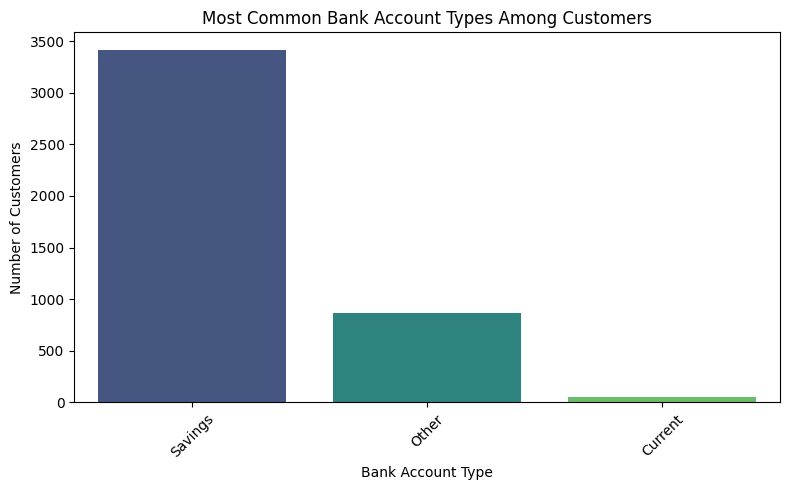

In [12]:
#Common bank account type amongst clients

# Count plot for bank account types
plt.figure(figsize=(8, 5))
sb.countplot(data=cus_data, x='bank_account_type', order=cus_data['bank_account_type'].value_counts().index, palette='viridis')

plt.title('Most Common Bank Account Types Among Customers')
plt.xlabel('Bank Account Type')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


In [13]:
# Customer Location Map
import folium
from folium.plugins import MarkerCluster

map_center = [cus_data['latitude_gps'].mean(), cus_data['longitude_gps'].mean()]
customer_map = folium.Map(
    location=map_center,
    zoom_start=6,
    tiles='cartodbpositron',
    control_scale=True
)

# Add a marker cluster
marker_cluster = MarkerCluster(
    show_coverage_on_hover=True,
    zoom=10,
    maxClusterRadius=50
).add_to(customer_map)

# Add customer markers with custom icons and popups
for _, row in cus_data.iterrows():
    folium.Marker(
        location=[row['latitude_gps'], row['longitude_gps']],
        popup=folium.Popup(row['bank_name_clients'], max_width=200),
        icon=folium.Icon(color='blue', icon='university', prefix='fa')  # Bank icon
    ).add_to(marker_cluster)

# Add a layer control for interactivity
folium.LayerControl().add_to(customer_map)

# If running in a Jupyter notebook, display the map
customer_map

/tmp/ipython-input-2745858733.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sb.countplot(data=cus_data, x='bank_name_clients', order=cus_data['bank_name_clients'].value_counts().index, palette='viridis')


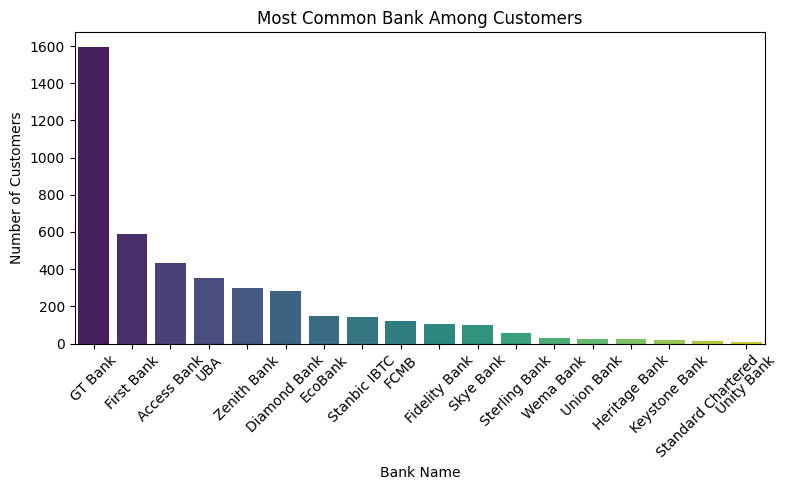

In [14]:
#Client Bank
plt.figure(figsize=(8, 5))
sb.countplot(data=cus_data, x='bank_name_clients', order=cus_data['bank_name_clients'].value_counts().index, palette='viridis')

plt.title('Most Common Bank Among Customers')
plt.xlabel('Bank Name')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

/tmp/ipython-input-3649671441.py:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sb.countplot(data=cus_data, x='employment_status_clients', order=cus_data['employment_status_clients'].value_counts().index, palette='viridis')


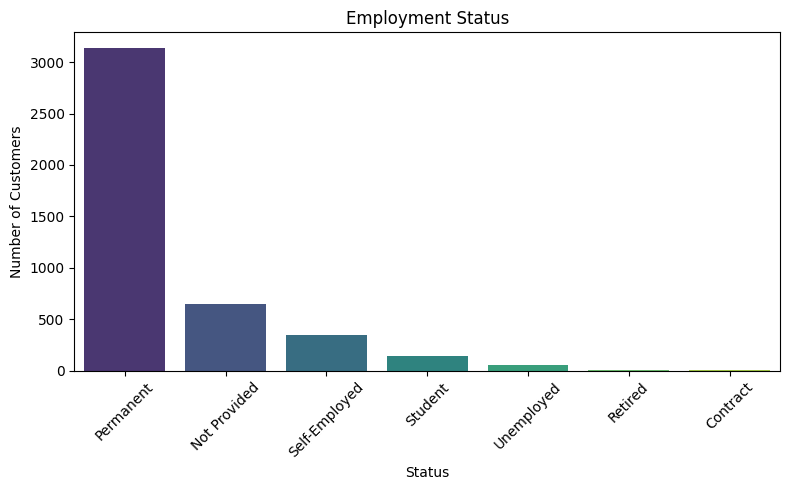

In [15]:
#client employment
plt.figure(figsize=(8, 5))
sb.countplot(data=cus_data, x='employment_status_clients', order=cus_data['employment_status_clients'].value_counts().index, palette='viridis')

plt.title('Employment Status')
plt.xlabel('Status')
plt.ylabel('Number of Customers')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### Findings

- The majority of customers hold savings accounts.

- A large proportion of customers are based in Nigeria (4,311).

- GT Bank is the most commonly used bank among customers.

- Regarding employment: the majority are permanent staff, followed by self-employed customers. A smaller segment did not provide their employment status.

## Loan History

This contains data regarding customer's loans

In [16]:
loan_hist.head()

,customerid,systemloanid,loannumber,approveddate,creationdate,loanamount,totaldue,termdays,closeddate,referredby,firstduedate,firstrepaiddate
0,8a2a81a74ce8c05d014cfb32a0da1049,301682320,2,2016-08-15 18:22:40.000000,2016-08-15 17:22:32.000000,10000.0,13000.0,30,2016-09-01 16:06:48.000000,NaN,2016-09-14 00:00:00.000000,2016-09-01 15:51:43.000000
1,8a2a81a74ce8c05d014cfb32a0da1049,301883808,9,2017-04-28 18:39:07.000000,2017-04-28 17:38:53.000000,10000.0,13000.0,30,2017-05-28 14:44:49.000000,NaN,2017-05-30 00:00:00.000000,2017-05-26 00:00:00.000000
2,8a2a81a74ce8c05d014cfb32a0da1049,301831714,8,2017-03-05 10:56:25.000000,2017-03-05 09:56:19.000000,20000.0,23800.0,30,2017-04-26 22:18:56.000000,NaN,2017-04-04 00:00:00.000000,2017-04-26 22:03:47.000000
3,8a8588f35438fe12015444567666018e,301861541,5,2017-04-09 18:25:55.000000,2017-04-09 17:25:42.000000,10000.0,11500.0,15,2017-04-24 01:35:52.000000,NaN,2017-04-24 00:00:00.000000,2017-04-24 00:48:43.000000
4,8a85890754145ace015429211b513e16,301941754,2,2017-06-17 09:29:57.000000,2017-06-17 08:29:50.000000,10000.0,11500.0,15,2017-07-14 21:18:43.000000,NaN,2017-07-03 00:00:00.000000,2017-07-14 21:08:35.000000


In [17]:
loan_hist.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18183 entries, 0 to 18182
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   customerid       18183 non-null  object 
 1   systemloanid     18183 non-null  int64  
 2   loannumber       18183 non-null  int64  
 3   approveddate     18183 non-null  object 
 4   creationdate     18183 non-null  object 
 5   loanamount       18183 non-null  float64
 6   totaldue         18183 non-null  float64
 7   termdays         18183 non-null  int64  
 8   closeddate       18183 non-null  object 
 9   referredby       1026 non-null   object 
 10  firstduedate     18183 non-null  object 
 11  firstrepaiddate  18183 non-null  object 
dtypes: float64(2), int64(3), object(7)
memory usage: 1.7+ MB


Dates are not in correct data type

In [18]:
loan_hist.describe().T

,count,mean,std,min,25%,50%,75%,max
systemloanid,18183.0,3.018395e+08,93677.672704,301600134.0,301776577.0,301854965.0,301919682.5,302000275.0
loannumber,18183.0,4.189353e+00,3.249490,1.0,2.0,3.0,6.0,26.0
loanamount,18183.0,1.650124e+04,9320.547516,3000.0,10000.0,10000.0,20000.0,60000.0
totaldue,18183.0,1.957320e+04,10454.245277,3450.0,11500.0,13000.0,24500.0,68100.0
termdays,18183.0,2.669279e+01,10.946556,15.0,15.0,30.0,30.0,90.0


In [19]:
loan_hist.duplicated().sum()

np.int64(0)

In [20]:
#returning customers
loan_hist.customerid.duplicated().sum()

np.int64(13824)

customerid has duplicates as this data contains all loans collected by each customer

While the referredby column has some missing values, these nulls actually represent customers who were not referred. Thus, the column continues to offer valuable information for analysis.

In [21]:
loan_hist.referredby.isna().sum()

np.int64(17157)

##### Data Cleaning

In [22]:
#transforming referred by column by filling null with not referred and the ones referred with Referred
loan_hist['referredby'] = loan_hist['referredby'].fillna('Not Referred')
loan_hist['referredby'] = loan_hist['referredby'].apply(lambda x: 'Referred' if x != 'Not Referred' else x)

In [23]:
# converting dates to datetime
date_columns = ['approveddate', 'creationdate', 'closeddate', 'firstduedate', 'firstrepaiddate']
for col in date_columns:
    loan_hist[col] = pd.to_datetime(loan_hist[col])

In [24]:
loan_hist.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 18183 entries, 0 to 18182
Data columns (total 12 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   customerid       18183 non-null  object        
 1   systemloanid     18183 non-null  int64         
 2   loannumber       18183 non-null  int64         
 3   approveddate     18183 non-null  datetime64[ns]
 4   creationdate     18183 non-null  datetime64[ns]
 5   loanamount       18183 non-null  float64       
 6   totaldue         18183 non-null  float64       
 7   termdays         18183 non-null  int64         
 8   closeddate       18183 non-null  datetime64[ns]
 9   referredby       18183 non-null  object        
 10  firstduedate     18183 non-null  datetime64[ns]
 11  firstrepaiddate  18183 non-null  datetime64[ns]
dtypes: datetime64[ns](5), float64(2), int64(3), object(2)
memory usage: 1.7+ MB


In [25]:
loan_hist.describe()

,systemloanid,loannumber,approveddate,creationdate,loanamount,totaldue,termdays,closeddate,firstduedate,firstrepaiddate
count,1.818300e+04,18183.000000,18183,18183,18183.000000,18183.000000,18183.000000,18183,18183,18183
mean,3.018395e+08,4.189353,2017-02-25 09:59:36.147390464,2017-02-25 08:55:29.725677824,16501.237420,19573.202931,26.692790,2017-03-21 06:55:48.228895232,2017-03-22 09:52:03.642963456,2017-03-20 11:45:09.015893760
min,3.016001e+08,1.000000,2016-01-15 08:53:28,2016-01-15 07:53:17,3000.000000,3450.000000,15.000000,2016-02-02 08:18:15,2016-02-15 00:00:00,2016-02-02 08:13:55
25%,3.017766e+08,2.000000,2016-12-19 16:13:04.500000,2016-12-19 15:12:53.500000,10000.000000,11500.000000,15.000000,2017-01-16 20:53:36,2017-01-16 00:00:00,2017-01-14 08:47:29.500000
50%,3.018550e+08,3.000000,2017-04-04 16:44:44,2017-04-04 15:44:31,10000.000000,13000.000000,30.000000,2017-04-27 17:18:59,2017-05-02 00:00:00,2017-04-26 21:16:22
75%,3.019197e+08,6.000000,2017-05-27 15:07:16,2017-05-27 14:07:06.500000,20000.000000,24500.000000,30.000000,2017-06-21 19:12:49,2017-06-22 00:00:00,2017-06-20 18:22:47
max,3.020003e+08,26.000000,2017-07-28 10:47:43,2017-07-28 09:46:34,60000.000000,68100.000000,90.000000,2017-07-30 22:09:11,2017-08-22 00:00:00,2017-07-30 21:59:01
std,9.367767e+04,3.249490,NaN,NaN,9320.547516,10454.245277,10.946556,NaN,NaN,NaN


**From date information:**

- Difference between first due date and first repaid date – captures how promptly a customer makes their first repayment, which is critical for identifying potential defaulters.

- Difference between closed date and approved date (loan duration) – measures the actual duration of the loan, useful for assessing repayment behavior and loan management.

**Derived from loan amount, total due, term days, and loan duration:**

- Interest rate – percentage of interest charged on the loan; important for evaluating loan profitability and customer cost burden.

- Repayment multiple – the ratio of total repayment to principal; helps assess if customers are over-repaying or under-repaying relative to the loan amount.

- Difference between planned term and actual loan duration – indicates deviations in repayment schedules, highlighting potential repayment issues.

- Number of days between consecutive loans – shows customer borrowing frequency, which can signal risk patterns or over-leveraging.

In [26]:
#calculating actual loan duration in days
loan_hist['loan_duration'] = (loan_hist['closeddate'] - loan_hist['approveddate']).dt.days

In [27]:
# calculating difference between first repaid date and first due date in days
loan_hist['first_repayment_diff_days'] = (loan_hist['firstrepaiddate'] - loan_hist['firstduedate']).dt.days

In [28]:
#calculating difference between bank stated term days and the actual loan duration
loan_hist['overall_repayment_diff_days'] = loan_hist['loan_duration'] - loan_hist['termdays']

In [29]:
#Interest rate
loan_hist['interest_rate'] = (loan_hist['totaldue']-loan_hist['loanamount']) / loan_hist['loanamount']*100

In [30]:
#repayment multiple
loan_hist['repayment_multiple'] = loan_hist['totaldue']/loan_hist['loanamount']

In [31]:
# Calculating difference in days between consecutive loans per customer
loan_hist = loan_hist.sort_values(['customerid', 'approveddate'])
loan_hist['days_between_loans'] = loan_hist.groupby('customerid')['approveddate'].diff().dt.days

In [32]:
loan_hist.info()

<class 'pandas.core.frame.DataFrame'>
Index: 18183 entries, 1893 to 1216
Data columns (total 18 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   customerid                   18183 non-null  object        
 1   systemloanid                 18183 non-null  int64         
 2   loannumber                   18183 non-null  int64         
 3   approveddate                 18183 non-null  datetime64[ns]
 4   creationdate                 18183 non-null  datetime64[ns]
 5   loanamount                   18183 non-null  float64       
 6   totaldue                     18183 non-null  float64       
 7   termdays                     18183 non-null  int64         
 8   closeddate                   18183 non-null  datetime64[ns]
 9   referredby                   18183 non-null  object        
 10  firstduedate                 18183 non-null  datetime64[ns]
 11  firstrepaiddate              18183 non-null 

In [33]:
loan_hist.head()

,customerid,systemloanid,loannumber,approveddate,creationdate,loanamount,totaldue,termdays,closeddate,referredby,firstduedate,firstrepaiddate,loan_duration,first_repayment_diff_days,overall_repayment_diff_days,interest_rate,repayment_multiple,days_between_loans
1893,8a1088a0484472eb01484669e3ce4e0b,301960241,1,2017-07-02 19:19:01,2017-07-02 18:17:53,10000.0,11500.0,15,2017-07-24 20:50:43,Not Referred,2017-07-18,2017-07-24 20:40:34,22,6,7,15.0,1.150,NaN
5216,8a1a1e7e4f707f8b014f797718316cad,301620412,1,2016-05-13 15:29:37,2016-05-13 14:29:31,10000.0,13000.0,30,2016-06-15 00:03:33,Not Referred,2016-06-13,2016-06-14 10:41:13,32,1,2,30.0,1.300,NaN
17546,8a1a1e7e4f707f8b014f797718316cad,301632940,2,2016-06-15 11:22:38,2016-06-15 10:22:32,10000.0,13000.0,30,2016-07-15 13:59:02,Not Referred,2016-07-15,2016-07-15 13:43:58,30,0,0,30.0,1.300,32.0
7999,8a1a1e7e4f707f8b014f797718316cad,301916386,3,2017-05-23 14:21:42,2017-05-23 13:20:30,20000.0,24500.0,30,2017-06-21 21:58:00,Not Referred,2017-06-22,2017-06-21 21:47:51,29,-1,-1,22.5,1.225,342.0
16602,8a1a1e7e4f707f8b014f797718316cad,301947045,4,2017-06-21 22:09:51,2017-06-21 21:09:44,30000.0,39000.0,60,2017-07-26 19:48:11,Not Referred,2017-07-21,2017-07-20 15:05:33,34,-1,-26,30.0,1.300,29.0


In [34]:
loan_hist.describe()

,systemloanid,loannumber,approveddate,creationdate,loanamount,totaldue,termdays,closeddate,firstduedate,firstrepaiddate,loan_duration,first_repayment_diff_days,overall_repayment_diff_days,interest_rate,repayment_multiple,days_between_loans
count,1.818300e+04,18183.000000,18183,18183,18183.000000,18183.000000,18183.000000,18183,18183,18183,18183.00000,18183.000000,18183.00000,18183.000000,18183.000000,13824.000000
mean,3.018395e+08,4.189353,2017-02-25 09:59:36.147390464,2017-02-25 08:55:29.725677824,16501.237420,19573.202931,26.692790,2017-03-21 06:55:48.228894976,2017-03-22 09:52:03.642963200,2017-03-20 11:45:09.015894272,23.38041,-2.473904,-3.31238,20.370628,1.203706,34.750434
min,3.016001e+08,1.000000,2016-01-15 08:53:28,2016-01-15 07:53:17,3000.000000,3450.000000,15.000000,2016-02-02 08:18:15,2016-02-15 00:00:00,2016-02-02 08:13:55,0.00000,-32.000000,-76.00000,0.000000,1.000000,0.000000
25%,3.017766e+08,2.000000,2016-12-19 16:13:04.500000,2016-12-19 15:12:53.500000,10000.000000,11500.000000,15.000000,2017-01-16 20:53:36,2017-01-16 00:00:00,2017-01-14 08:47:29.500000,14.00000,-6.000000,-6.00000,15.000000,1.150000,17.000000
50%,3.018550e+08,3.000000,2017-04-04 16:44:44,2017-04-04 15:44:31,10000.000000,13000.000000,30.000000,2017-04-27 17:18:59,2017-05-02 00:00:00,2017-04-26 21:16:22,25.00000,-2.000000,-2.00000,19.000000,1.190000,28.000000
75%,3.019197e+08,6.000000,2017-05-27 15:07:16,2017-05-27 14:07:06.500000,20000.000000,24500.000000,30.000000,2017-06-21 19:12:49,2017-06-22 00:00:00,2017-06-20 18:22:47,29.00000,0.000000,0.00000,30.000000,1.300000,34.000000
max,3.020003e+08,26.000000,2017-07-28 10:47:43,2017-07-28 09:46:34,60000.000000,68100.000000,90.000000,2017-07-30 22:09:11,2017-08-22 00:00:00,2017-07-30 21:59:01,380.00000,351.000000,350.00000,30.000000,1.300000,494.000000
std,9.367767e+04,3.249490,NaN,NaN,9320.547516,10454.245277,10.946556,NaN,NaN,NaN,13.25201,9.900832,11.18806,7.435382,0.074354,40.649963


## Insights



In [35]:
# Select only numeric columns (excluding datetime)
numeric_cols = loan_hist.select_dtypes(include=['number'])

# Get describe and filter only mean, min, max
summary = numeric_cols.describe().loc[['mean', 'min', 'max']]
summary


,systemloanid,loannumber,loanamount,totaldue,termdays,loan_duration,first_repayment_diff_days,overall_repayment_diff_days,interest_rate,repayment_multiple,days_between_loans
mean,3.018395e+08,4.189353,16501.23742,19573.202931,26.69279,23.38041,-2.473904,-3.31238,20.370628,1.203706,34.750434
min,3.016001e+08,1.000000,3000.00000,3450.000000,15.00000,0.00000,-32.000000,-76.00000,0.000000,1.000000,0.000000
max,3.020003e+08,26.000000,60000.00000,68100.000000,90.00000,380.00000,351.000000,350.00000,30.000000,1.300000,494.000000


In [36]:
# Total loan given out
total_loan = loan_hist['loanamount'].sum()

# Total interest gotten
total_interest = (loan_hist['totaldue'] - loan_hist['loanamount']).sum()

print(f"Total loan amount lent out is ₦{total_loan:,.2f}")
print(f"Total company profit is ₦{total_interest:,.2f}")

profit_margin = (total_interest / total_loan) * 100
print(f"Profit margin: {profit_margin:.2f}%")


Total loan amount lent out is ₦300,042,000.00
Total company profit is ₦55,857,548.90
Profit margin: 18.62%


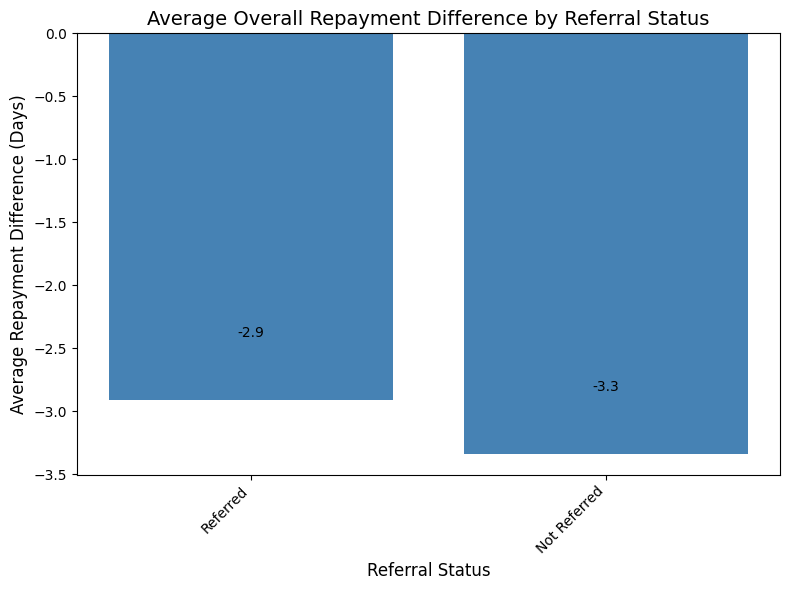

In [37]:
# Group by referral status and calculate average repayment difference
referral_avg = loan_hist.groupby("referredby")["overall_repayment_diff_days"].mean().reset_index()

# Sort values for nicer plotting
referral_avg = referral_avg.sort_values("overall_repayment_diff_days", ascending=False)

# Plot
plt.figure(figsize=(8,6))
plt.bar(referral_avg["referredby"], referral_avg["overall_repayment_diff_days"], color="steelblue")

plt.title("Average Overall Repayment Difference by Referral Status", fontsize=14)
plt.xlabel("Referral Status", fontsize=12)
plt.ylabel("Average Repayment Difference (Days)", fontsize=12)
plt.xticks(rotation=45, ha="right")

# Add value labels on top of bars
for i, v in enumerate(referral_avg["overall_repayment_diff_days"]):
    plt.text(i, v + 0.5, f"{v:.1f}", ha="center", fontsize=10)

plt.tight_layout()
plt.show()


Date with the highest total loan disbursed:
Date: 2017-06-28, Total Loan: ₦3,490,000.00, Average Loan: ₦18,663.10, Number of Loans: 187


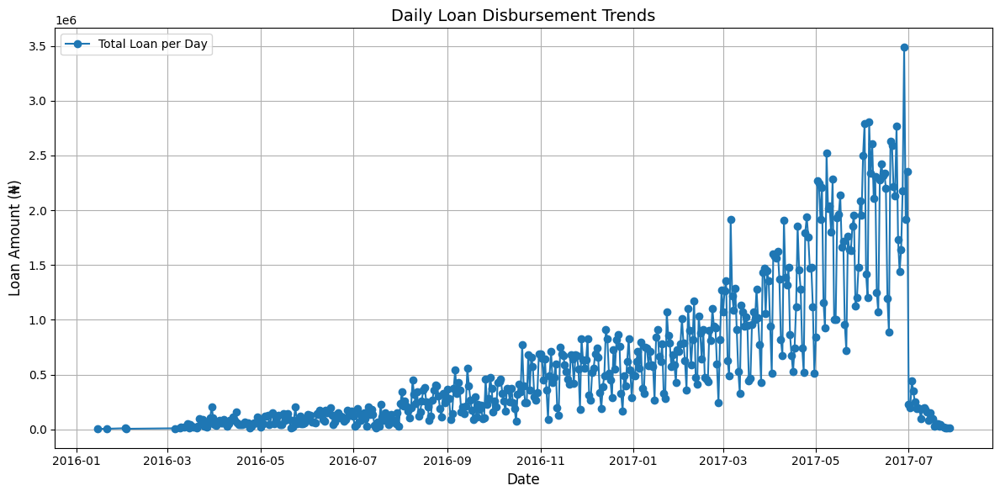

In [38]:
# Group by date to get total loan amount and average loan per day
loan_by_date = loan_hist.groupby(loan_hist["approveddate"].dt.date).agg(
    total_loan=("loanamount", "sum"),
    avg_loan=("loanamount", "mean"),
    count=("loanamount", "count")
).reset_index()

# Find the date with the highest total loan
top_date = loan_by_date.loc[loan_by_date["total_loan"].idxmax()]

print("Date with the highest total loan disbursed:")
print(f"Date: {top_date['approveddate']}, Total Loan: ₦{top_date['total_loan']:,.2f}, "
      f"Average Loan: ₦{top_date['avg_loan']:,.2f}, Number of Loans: {top_date['count']}")

# Plot trend of total loans disbursed over time
plt.figure(figsize=(12,6))
plt.plot(loan_by_date["approveddate"], loan_by_date["total_loan"], marker="o", label="Total Loan per Day")

plt.title("Daily Loan Disbursement Trends", fontsize=14)
plt.xlabel("Date", fontsize=12)
plt.ylabel("Loan Amount (₦)", fontsize=12)
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [39]:
# Filter loans borrowed on June 28
june28_loans = loan_hist[loan_hist["approveddate"].dt.date == pd.to_datetime("2017-06-28").date()]

# Average repayment difference (days)
avg_repayment_june28 = june28_loans["overall_repayment_diff_days"].mean()

# Classify repayment behavior
if avg_repayment_june28 < 0:
    status = "earlier than agreed"
elif avg_repayment_june28 == 0:
    status = "on time"
else:
    status = "later than agreed"

print(f"On June 28 2017, the average repayment difference was {avg_repayment_june28:.2f} days, meaning customers repaid {status}.")


On June 28 2017, the average repayment difference was -4.51 days, meaning customers repaid earlier than agreed.


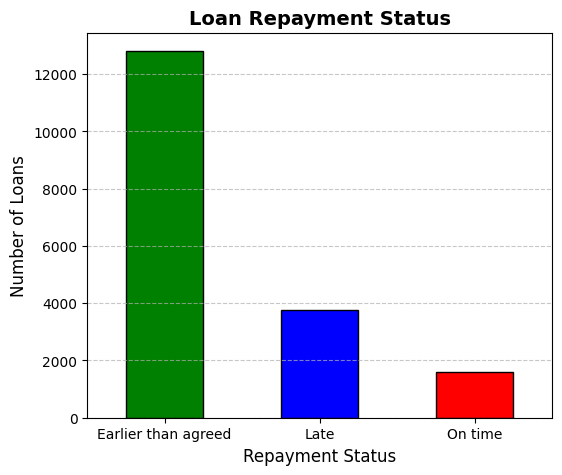

In [40]:
# Creating a new variable for repayment status
def repayment_status(x):
    if x < 0:
        return "Earlier than agreed"
    elif x == 0:
        return "On time"
    else:
        return "Late"

repayment_status_var = loan_hist["overall_repayment_diff_days"].apply(repayment_status)

# Count each repayment status
status_counts = repayment_status_var.value_counts()

# Plot
plt.figure(figsize=(6, 5))
status_counts.plot(kind="bar", color=["green", "blue", "red"], edgecolor="black")

plt.title("Loan Repayment Status", fontsize=14, weight="bold")
plt.xlabel("Repayment Status", fontsize=12)
plt.ylabel("Number of Loans", fontsize=12)
plt.xticks(rotation=0)
plt.grid(axis="y", linestyle="--", alpha=0.7)

plt.show()


**Key Insights**

The company has disbursed ₦300.04 million in loans, generating a profit of ₦55.86 million, which corresponds to an overall profit margin of approximately 18.6%, indicating that the loan portfolio is profitable.

On average, customers borrow around ₦16,500 and repay approximately 1.2 times the loan amount, with interest rates averaging 20%.

Customers who were not referred tend to repay earlier than those who were referred.

The highest loan disbursement occurred on June 28th, even though it was not a holiday. This could be influenced by end-of-month financial pressures, or operational factors such as batch processing or marketing campaigns. Interestingly, on this date, customers on average repaid earlier than agreed.

Most customers repaid earlier than agreed, followed by those who repaid late, highlighting generally strong repayment behavior.

## Customer Repayment Profile

To create the customer repayment profile, loan history will be aggregated for each individual.

In [41]:
# Aggregating customer profile
customer_profile = loan_hist.groupby("customerid").agg({
    "systemloanid": "count",             # total number of loans
    "loanamount": "mean",                # avg loan amount
    "totaldue": "mean",                  # avg total due
    "termdays": "mean",                  # avg loan term
    "loan_duration": "mean",             # avg loan duration
    "first_repayment_diff_days": "mean", # avg first repayment diff
    "overall_repayment_diff_days": "mean", # avg repayment diff
    "interest_rate": "mean",             # avg interest rate
    "repayment_multiple": "mean",        # avg repayment multiple
    "days_between_loans": "mean"         # avg days between loans
}).reset_index()

# Renaming for clarity
customer_profile = customer_profile.rename(columns={
    "systemloanid": "total_loans",
    "loanamount": "avg_loan_amount",
    "totaldue": "avg_total_due",
    "termdays": "avg_term_days",
    "loan_duration": "avg_loan_duration",
    "first_repayment_diff_days": "avg_first_repay_diff",
    "overall_repayment_diff_days": "avg_overall_repay_diff",
    "interest_rate": "avg_interest_rate",
    "repayment_multiple": "avg_repayment_multiple",
    "days_between_loans": "avg_days_between_loans"
})


In [42]:
customer_profile.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4359 entries, 0 to 4358
Data columns (total 11 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   customerid              4359 non-null   object 
 1   total_loans             4359 non-null   int64  
 2   avg_loan_amount         4359 non-null   float64
 3   avg_total_due           4359 non-null   float64
 4   avg_term_days           4359 non-null   float64
 5   avg_loan_duration       4359 non-null   float64
 6   avg_first_repay_diff    4359 non-null   float64
 7   avg_overall_repay_diff  4359 non-null   float64
 8   avg_interest_rate       4359 non-null   float64
 9   avg_repayment_multiple  4359 non-null   float64
 10  avg_days_between_loans  2966 non-null   float64
dtypes: float64(9), int64(1), object(1)
memory usage: 374.7+ KB


Note: Average days between loans has missing values

##### Feature Engineering

- Borrower type – derived from the days between loans. This helps classify customers based on borrowing frequency, which can indicate financial behavior and potential risk.

- Repayment behavior category – created as Early, On-time, or Late. This is crucial for identifying repayment patterns, detecting high-risk borrowers, and informing credit decisions.

In [43]:
# Create new column for borrower type
customer_profile["borrower_type"] = np.where(
    customer_profile["avg_days_between_loans"].isna(),
    "One-time",
    "Frequent"
)

In [44]:
customer_profile["avg_days_between_loans"] = customer_profile["avg_days_between_loans"].fillna(-1)

Nulls in the average days between loans column were replaced with -1 rather than dropped. This is because they correspond to customers who borrowed only once, and retaining this information is important for both insight generation and predictive modeling.

In [45]:
# Defining a function to categorize customer's repayment behaviour
def categorize_repayment(x):
    if x < 0:
        return "Early"
    elif x == 0:
        return "On-time"
    else:
        return "Late"

# Apply to both columns
customer_profile["first_repay_category"] = customer_profile["avg_first_repay_diff"].apply(categorize_repayment)
customer_profile["overall_repay_category"] = customer_profile["avg_overall_repay_diff"].apply(categorize_repayment)

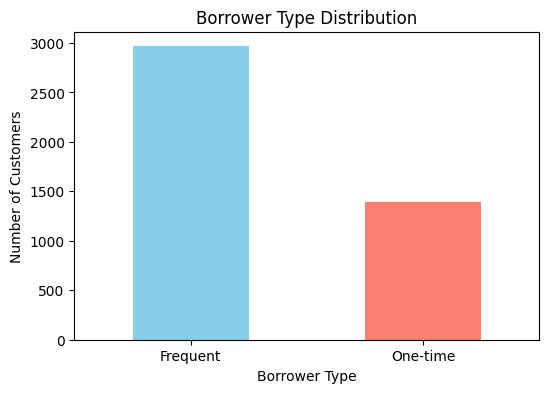

In [46]:
# Count borrower types
borrower_counts = customer_profile["borrower_type"].value_counts()

# Plot
plt.figure(figsize=(6,4))
borrower_counts.plot(kind="bar", color=["skyblue", "salmon"])

plt.title("Borrower Type Distribution")
plt.xlabel("Borrower Type")
plt.ylabel("Number of Customers")
plt.xticks(rotation=0)
plt.show()

Average repayment diff (days):
borrower_type
Frequent   -2.393403
One-time   -3.061019
Name: avg_overall_repay_diff, dtype: float64


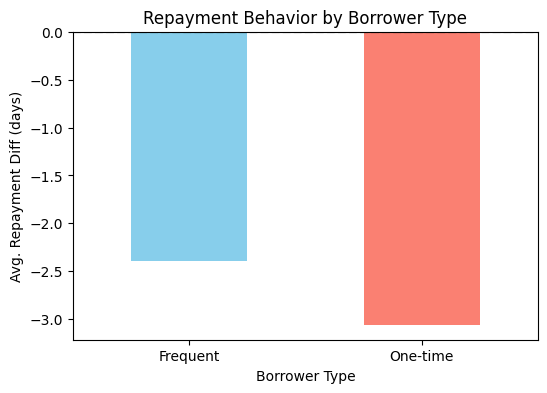

In [47]:
import matplotlib.pyplot as plt

# Group by borrower type and take mean repayment diff
repayment_behavior = customer_profile.groupby("borrower_type")["avg_overall_repay_diff"].mean()

print("Average repayment diff (days):")
print(repayment_behavior)

# Plot
plt.figure(figsize=(6,4))
repayment_behavior.plot(kind="bar", color=["skyblue", "salmon"])

plt.axhline(0, color="black", linestyle="--")  # line at 0 = on time
plt.title("Repayment Behavior by Borrower Type")
plt.ylabel("Avg. Repayment Diff (days)")
plt.xlabel("Borrower Type")
plt.xticks(rotation=0)
plt.show()


One-time borrowers tend to repay earlier than frequent borrowers, who show more variable repayment patterns.

Overall, there are more frequent borrowers which we can classify as more returning customers

### **Reasoning**

The predictive approach of relying solely on past closed loans to determine whether a customer will default has significant limitations. This is because repayment history is only available for returning customers, leaving new customers without any behavioral data. If the model is trained exclusively on past loans, it introduces a bias—it will perform well on customers with previous records but completely fail to generalize to first-time borrowers.

Moreover, attempting to merge the dataset of past loans with the dataset containing the current good_bad_flag introduces a logical inconsistency. The good_bad_flag attached to the current loan reflects the outcome of that specific loan only; it cannot retroactively represent the performance of previous loans. For example, a customer might have repaid their earlier loans on time (good) but later defaulted on their current loan (bad). If past and present records are merged without careful separation, the model could mistakenly learn misleading relationships, effectively "contaminating" the historical data with information from the future.

This highlights a crucial data integrity principle: labels must remain temporally consistent with the features they describe. In other words, we should not apply a label from a future loan to past loans unless those past loans originally carried their own good_bad_flag. Had the historical dataset included outcomes for each past loan, those could have been valid training examples.

Given these realities, the more reliable approach is to train the model primarily on current active loans, where the good_bad_flag correctly reflects repayment outcomes, while also engineering features that capture customer behavior patterns, financial attributes, and loan dynamics. This ensures that the model remains robust and fair for both new and returning customers, without compromising on data integrity.

Current loan data

In [48]:
#data properties
loan_curr.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4368 entries, 0 to 4367
Data columns (total 10 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   customerid     4368 non-null   object 
 1   systemloanid   4368 non-null   int64  
 2   loannumber     4368 non-null   int64  
 3   approveddate   4368 non-null   object 
 4   creationdate   4368 non-null   object 
 5   loanamount     4368 non-null   float64
 6   totaldue       4368 non-null   float64
 7   termdays       4368 non-null   int64  
 8   referredby     587 non-null    object 
 9   good_bad_flag  4368 non-null   object 
dtypes: float64(2), int64(3), object(5)
memory usage: 341.4+ KB


In [49]:
#missing data
loan_curr.referredby.isna().sum()

np.int64(3781)

In [50]:
#transforming referred by column by filling null with not referred and the ones referred with Referred
loan_curr['referredby'] = loan_curr['referredby'].fillna('Not Referred')
loan_curr['referredby'] = loan_curr['referredby'].apply(lambda x: 'Referred' if x != 'Not Referred' else x)

In [51]:
# converting dates to datetime
date_columns = ['approveddate', 'creationdate']
for col in date_columns:
    loan_curr[col] = pd.to_datetime(loan_curr[col])

In [52]:
#deriving interest rate from loanamount and totaldue data
#Interest rate
loan_curr['interest_rate'] = (loan_curr['totaldue']-loan_curr['loanamount']) / loan_curr['loanamount']*100

In [53]:
#merging dataset on customerID
merged_df = loan_curr.merge(
    cus_data,
    on="customerid",
    how="inner"
)

In [54]:
merged_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3269 entries, 0 to 3268
Data columns (total 17 columns):
 #   Column                     Non-Null Count  Dtype         
---  ------                     --------------  -----         
 0   customerid                 3269 non-null   object        
 1   systemloanid               3269 non-null   int64         
 2   loannumber                 3269 non-null   int64         
 3   approveddate               3269 non-null   datetime64[ns]
 4   creationdate               3269 non-null   datetime64[ns]
 5   loanamount                 3269 non-null   float64       
 6   totaldue                   3269 non-null   float64       
 7   termdays                   3269 non-null   int64         
 8   referredby                 3269 non-null   object        
 9   good_bad_flag              3269 non-null   object        
 10  interest_rate              3269 non-null   float64       
 11  birthdate                  3269 non-null   datetime64[ns]
 12  bank_a

### Feature Engineering

In [55]:
#customer age
merged_df['customer_age'] = ((merged_df['creationdate'] - merged_df['birthdate']).dt.days // 365).astype(int)


In [56]:
#age category
bins = [18, 24, 39, 59]
labels = ['Youth', 'Adult', 'Middle Age']

# Apply cut
merged_df['age_category'] = pd.cut(merged_df['customer_age'], bins=bins, labels=labels, right=True)


In [57]:
merged_df["Loan_Term_Category"] = np.where(
    (merged_df["termdays"] >= 15) & (merged_df["termdays"] <= 30),
    "Short Term",
    "Long Term"
)


## PREDICTION

In [58]:
#dropping columns not necessary for prediction
new = merged_df.drop(columns=['customerid', 'systemloanid','creationdate', 'approveddate','birthdate', 'bank_name_clients','longitude_gps', 'latitude_gps', 'loannumber'])

The New data contains only columns relevant for prediction, the date, IDs, customer bank name, lat and long are not features important for *prediction*

In [59]:
#encoding the target column as 0 and 1 (i.e Good-1, Bad-0) as model cannot predict with target column as object
new['target'] = (new['good_bad_flag'] == 'Good').astype(int)

In [60]:
new.target.value_counts()

,count
target,
1,2556
0,713


<Axes: xlabel='target'>

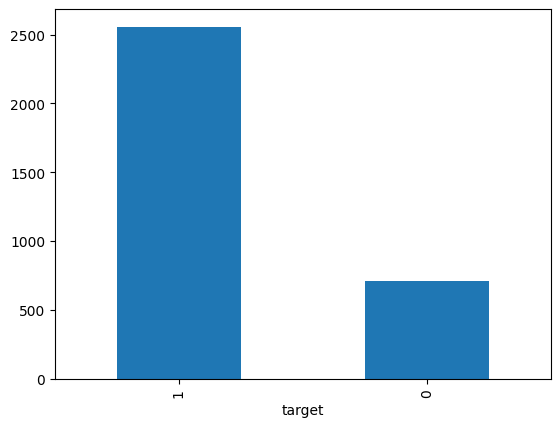

In [61]:
new.target.value_counts().plot(kind='bar')

Data Understanding

In [62]:
num_cols = ['loanamount', 'totaldue','interest_rate','customer_age']

cat_cols = ['referredby', 'bank_account_type','employment_status_clients', 'age_category', 'Loan_Term_Category']

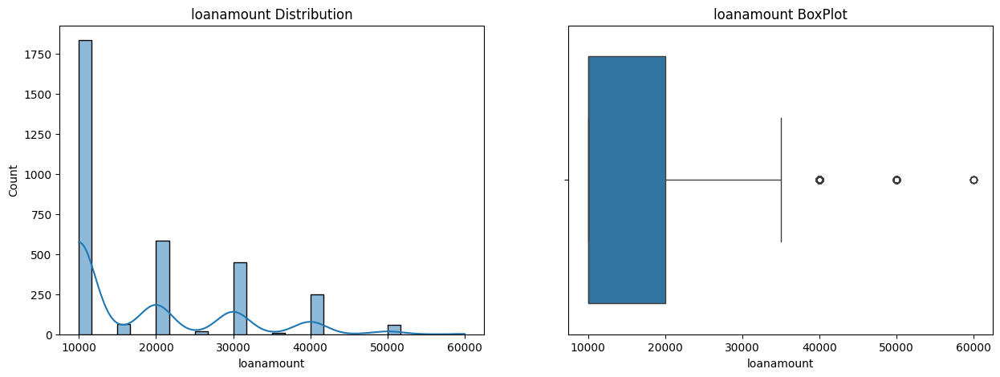

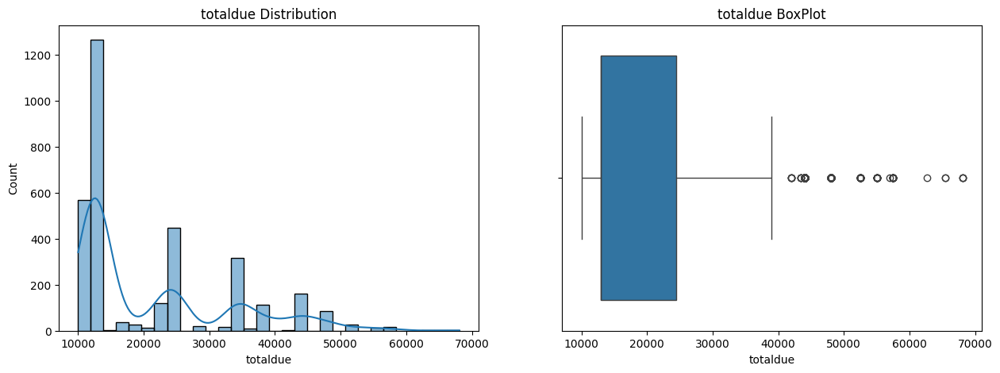

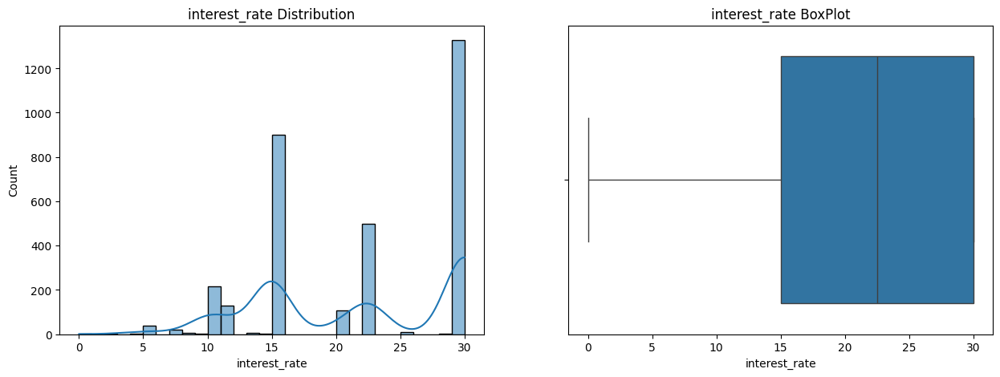

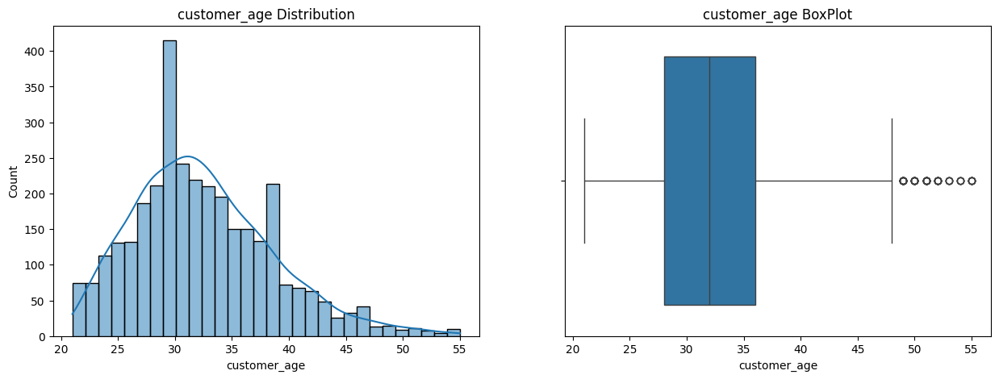

In [63]:
# checking distribution
for col in num_cols:
    plt.figure(figsize=(15,5))
    # Histogram
    plt.subplot(1, 2, 1)
    sb.histplot(data=new[col], kde=True, bins=30)
    plt.title(f'{col} Distribution')

    #boxplot
    plt.subplot(1,2,2)
    sb.boxplot(x=new[col])
    plt.title(f'{col} BoxPlot')
    plt.show()

In [64]:
target_col = 'target'

# Compute correlation matrix between numeric columns and target
corr_matrix = new[num_cols + [target_col]].corr()

# Show correlation of all numeric cols with target
corr_with_target = corr_matrix[target_col].sort_values(ascending=False)
print(corr_with_target)

target           1.000000
loanamount       0.117787
totaldue         0.112080
customer_age     0.061760
interest_rate   -0.121834
Name: target, dtype: float64


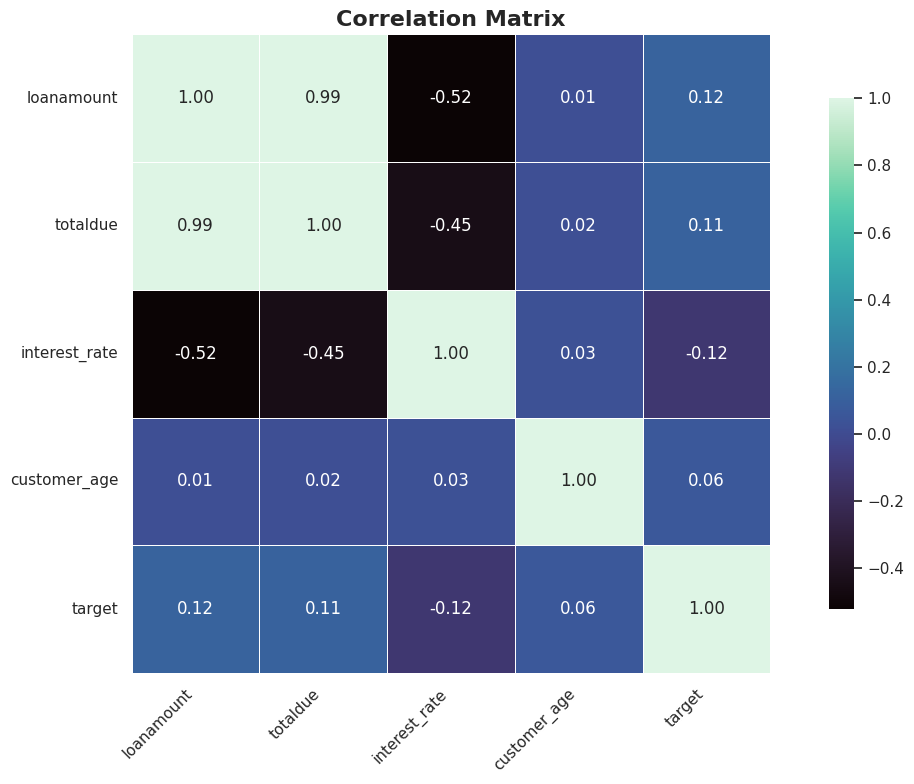

In [65]:
#plot correlation matrix
plt.figure(figsize=(12, 8))
sb.set(style="white")

# Plot the heatmap
sb.heatmap(
    corr_matrix,
    cmap="mako",
    annot=True,
    fmt=".2f",
    linewidths=0.5,
    cbar_kws={"shrink": 0.8},
    square=True
)

plt.title("Correlation Matrix", fontsize=16, weight='bold')
plt.xticks(rotation=45, ha='right')
plt.yticks(rotation=0)
plt.tight_layout()
plt.show()


It is important to note that the correlation between features and the target variable is generally low, indicating that these features are not strong predictors for identifying loan defaulters.

Data Preprocessing

In [66]:
#defining x and y
X= new.drop(columns=['good_bad_flag', 'target', 'termdays']) #dropping term days as it is not important for prediction
y= new['target']

In [67]:
#splitting data into train and test
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=42)

In [68]:
#Importing libraries foe encoding and scaling categorical and numerical columns repectively
from sklearn.preprocessing import StandardScaler,OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline

In [69]:
#create a pipeline for preprocessing
num_pipeline = Pipeline(steps=[
    ('scaler', StandardScaler())
])

cat_pipeline = Pipeline(steps=[
    ('encoder', OneHotEncoder(sparse_output= False, handle_unknown ='ignore'))
])

In [70]:
#apply preprocessing
preprocessor = ColumnTransformer(transformers=[
    ('num', num_pipeline, num_cols),
    ('cat', cat_pipeline, cat_cols)
])

In [71]:
!pip install catboost

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.2/99.2 MB 10.6 MB/s eta 0:00:00


In [72]:
#importing models and evaluation metrics required for prediction
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.neural_network import MLPClassifier
from catboost import CatBoostClassifier
from imblearn.ensemble import BalancedRandomForestClassifier, EasyEnsembleClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score, confusion_matrix, classification_report

models = {
    "Logistic Regression": LogisticRegression(max_iter=1000, class_weight="balanced"),
    "Random Forest": RandomForestClassifier(n_estimators=200, random_state=42, class_weight="balanced"),
    "XGBoost": XGBClassifier(n_estimators=300, learning_rate=0.1, max_depth=5, random_state=42, use_label_encoder=False, eval_metric="logloss"),
    "SVM": SVC(probability=True, class_weight="balanced", random_state=42),
    "Neural Net": MLPClassifier(hidden_layer_sizes=(64,32), max_iter=500, random_state=42),
    "Gradient Boosting": GradientBoostingClassifier(n_estimators=200, random_state=42),
    "CatBoost": CatBoostClassifier(iterations=200, verbose=0, random_state=42),
    "Easy Ensemble": EasyEnsembleClassifier(n_estimators=50, random_state=42),
    "Decision Tree": DecisionTreeClassifier(criterion="gini", max_depth=5, random_state=42)
}


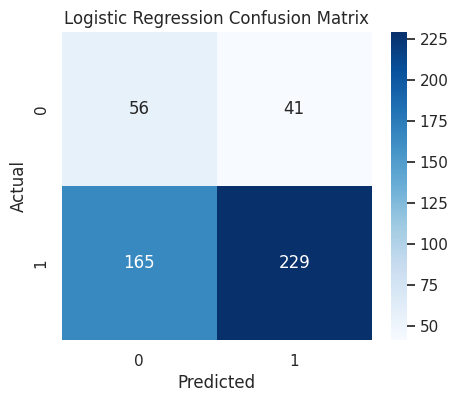


Logistic Regression Classification Report:

              precision    recall  f1-score   support

           0       0.25      0.58      0.35        97
           1       0.85      0.58      0.69       394

    accuracy                           0.58       491
   macro avg       0.55      0.58      0.52       491
weighted avg       0.73      0.58      0.62       491



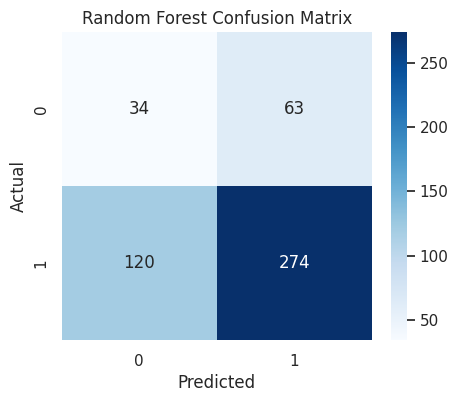


Random Forest Classification Report:

              precision    recall  f1-score   support

           0       0.22      0.35      0.27        97
           1       0.81      0.70      0.75       394

    accuracy                           0.63       491
   macro avg       0.52      0.52      0.51       491
weighted avg       0.70      0.63      0.66       491



/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [23:23:34] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


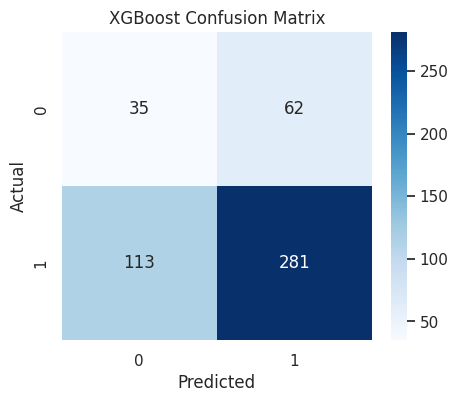


XGBoost Classification Report:

              precision    recall  f1-score   support

           0       0.24      0.36      0.29        97
           1       0.82      0.71      0.76       394

    accuracy                           0.64       491
   macro avg       0.53      0.54      0.52       491
weighted avg       0.70      0.64      0.67       491



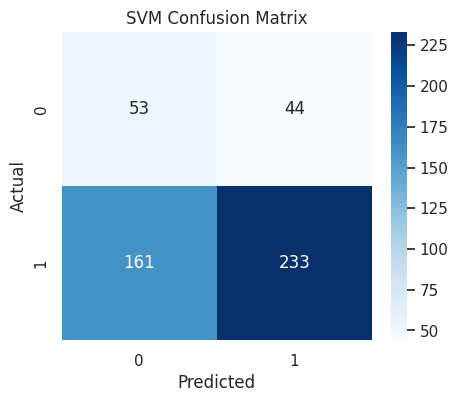


SVM Classification Report:

              precision    recall  f1-score   support

           0       0.25      0.55      0.34        97
           1       0.84      0.59      0.69       394

    accuracy                           0.58       491
   macro avg       0.54      0.57      0.52       491
weighted avg       0.72      0.58      0.62       491



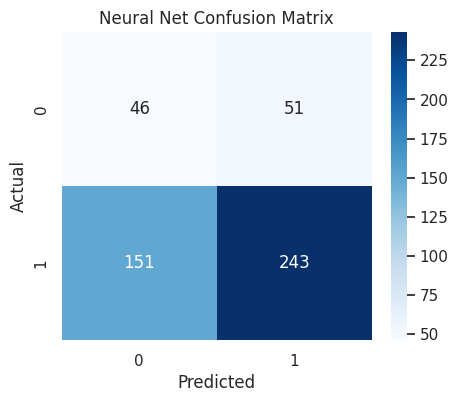


Neural Net Classification Report:

              precision    recall  f1-score   support

           0       0.23      0.47      0.31        97
           1       0.83      0.62      0.71       394

    accuracy                           0.59       491
   macro avg       0.53      0.55      0.51       491
weighted avg       0.71      0.59      0.63       491



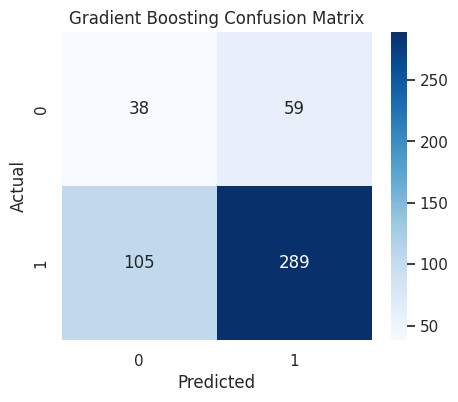


Gradient Boosting Classification Report:

              precision    recall  f1-score   support

           0       0.27      0.39      0.32        97
           1       0.83      0.73      0.78       394

    accuracy                           0.67       491
   macro avg       0.55      0.56      0.55       491
weighted avg       0.72      0.67      0.69       491



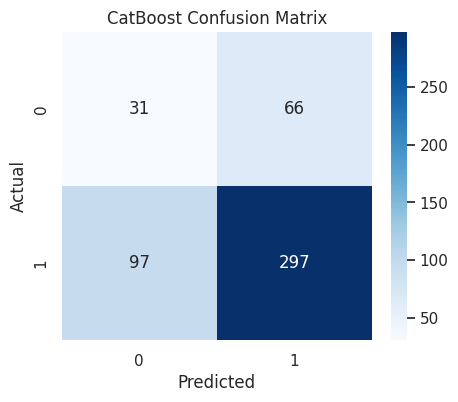


CatBoost Classification Report:

              precision    recall  f1-score   support

           0       0.24      0.32      0.28        97
           1       0.82      0.75      0.78       394

    accuracy                           0.67       491
   macro avg       0.53      0.54      0.53       491
weighted avg       0.70      0.67      0.68       491



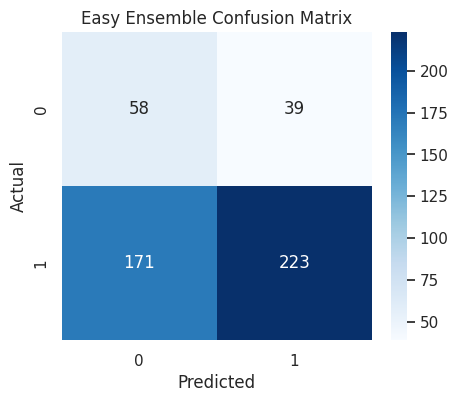


Easy Ensemble Classification Report:

              precision    recall  f1-score   support

           0       0.25      0.60      0.36        97
           1       0.85      0.57      0.68       394

    accuracy                           0.57       491
   macro avg       0.55      0.58      0.52       491
weighted avg       0.73      0.57      0.62       491



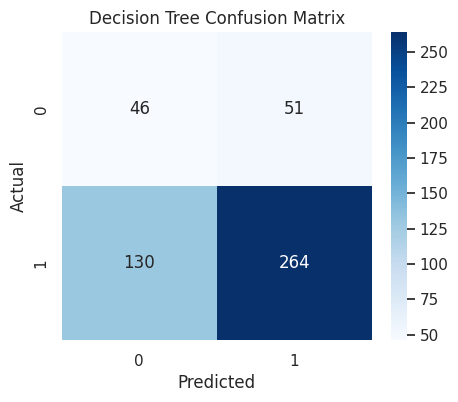


Decision Tree Classification Report:

              precision    recall  f1-score   support

           0       0.26      0.47      0.34        97
           1       0.84      0.67      0.74       394

    accuracy                           0.63       491
   macro avg       0.55      0.57      0.54       491
weighted avg       0.72      0.63      0.66       491



In [73]:
from imblearn.pipeline import Pipeline as ImbPipeline
from imblearn.over_sampling import SMOTE

results = {}

# loop through models
for name, model in models.items():
    pipeline = ImbPipeline(steps=[
        ('preprocessor', preprocessor),
        ('smote', SMOTE(random_state=42)),
        ('model', model)
    ])

    # fit model
    pipeline.fit(X_train, y_train)

    # predictions
    train_pred = pipeline.predict(X_train)
    test_pred = pipeline.predict(X_test)

    # probabilities (for ROC AUC)
    test_proba = pipeline.predict_proba(X_test)[:, 1]

    # metrics
    results[name] = {
        "Train Accuracy": accuracy_score(y_train, train_pred),
        "Test Accuracy": accuracy_score(y_test, test_pred),
        "Recall": recall_score(y_test, test_pred),
        "Precision": precision_score(y_test, test_pred),
        "F1 Score": f1_score(y_test, test_pred),
        "ROC AUC": roc_auc_score(y_test, test_proba),
        "Confusion Matrix": confusion_matrix(y_test, test_pred).tolist()  # stored as list so DataFrame won’t break
    }

    # Plot confusion matrix
    plt.figure(figsize=(5,4))
    sb.heatmap(results[name]["Confusion Matrix"], annot=True, fmt='d', cmap='Blues')
    plt.title(f'{name} Confusion Matrix')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.show()

    # Print classification report
    print(f"\n{name} Classification Report:\n")
    print(classification_report(y_test, test_pred))

# Convert to DataFrame (without confusion matrix column)
metrics1 = pd.DataFrame(results).T.drop(columns=["Confusion Matrix"])

In [74]:
metrics1

,Train Accuracy,Test Accuracy,Recall,Precision,F1 Score,ROC AUC
Logistic Regression,0.589633,0.580448,0.581218,0.848148,0.689759,0.603943
Random Forest,0.771778,0.627291,0.695431,0.813056,0.749658,0.505011
XGBoost,0.736141,0.643585,0.713198,0.819242,0.762551,0.556976
SVM,0.605472,0.582485,0.591371,0.841155,0.694486,0.581467
Neural Net,0.672426,0.588595,0.616751,0.826531,0.706395,0.570268
Gradient Boosting,0.716343,0.665988,0.733503,0.83046,0.778976,0.56336
CatBoost,0.734701,0.668024,0.753807,0.818182,0.784676,0.578275
Easy Ensemble,0.580994,0.572301,0.56599,0.851145,0.679878,0.603158
Decision Tree,0.645428,0.631365,0.670051,0.838095,0.744711,0.594066


Summary

While boosting models like CatBoost and XGBoost show higher overall performance, they are biased toward the majority class (good loans). This makes them appear strong but weak at identifying defaulters — the class that truly matters in loan prediction. In contrast, SVM, Easy Ensemble, and Decision Tree maintain a better balance between predicting good and bad loans. Their lower scores reflect the real challenge of detecting defaulters, giving a more honest view of model performance. For credit risk, these balanced models are more reliable because they reduce the risk of approving bad loans.

In [75]:
#Top model Result comparison
results = {
    "SVM": {
        "train_acc": 0.61,
        "test_acc": 0.58,
        "recall": 0.59,
        "precision": 0.84,
        "f1": 0.69,
        "roc_auc": 0.58
    },
    "Easy Ensemble": {
        "train_acc": 0.58,
        "test_acc": 0.57,
        "recall": 0.57,
        "precision": 0.85,
        "f1": 0.67,
        "roc_auc": 0.60
    },
    "Decision Tree":{
        'train_acc': 0.65,
        'test_acc': 0.63,
        'recall': 0.67,
        'precision': 0.84,
        'f1': 0.74,
        'roc_auc': 0.59
    }
}

df_results = pd.DataFrame(results)
print(df_results)

            SVM  Easy Ensemble  Decision Tree
train_acc  0.61           0.58           0.65
test_acc   0.58           0.57           0.63
recall     0.59           0.57           0.67
precision  0.84           0.85           0.84
f1         0.69           0.67           0.74
roc_auc    0.58           0.60           0.59


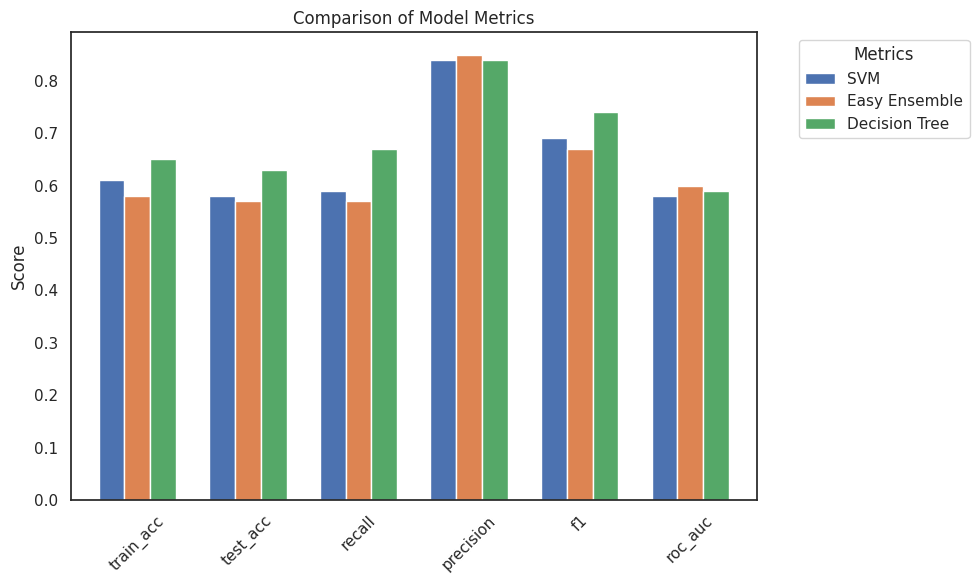

In [76]:
df_results.plot(kind="bar", figsize=(10,6), width=0.7)
plt.title("Comparison of Model Metrics")
plt.ylabel("Score")
plt.xticks(rotation=45)
plt.legend(title="Metrics", bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()



Logistic Regression Classification Report:

              precision    recall  f1-score   support

           0       0.28      0.62      0.38       616
           1       0.83      0.54      0.65      2162

    accuracy                           0.56      2778
   macro avg       0.56      0.58      0.52      2778
weighted avg       0.71      0.56      0.59      2778



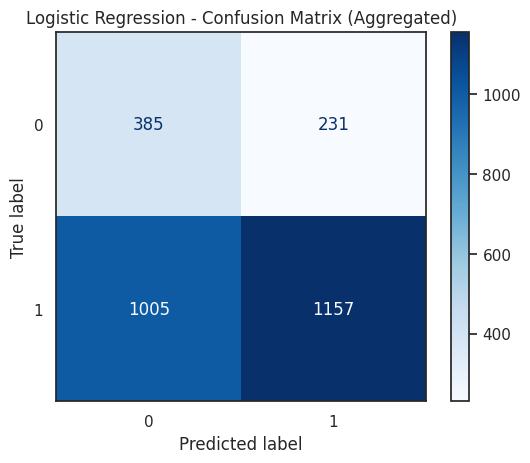


Random Forest Classification Report:

              precision    recall  f1-score   support

           0       0.28      0.35      0.31       616
           1       0.80      0.74      0.77      2162

    accuracy                           0.65      2778
   macro avg       0.54      0.55      0.54      2778
weighted avg       0.68      0.65      0.67      2778



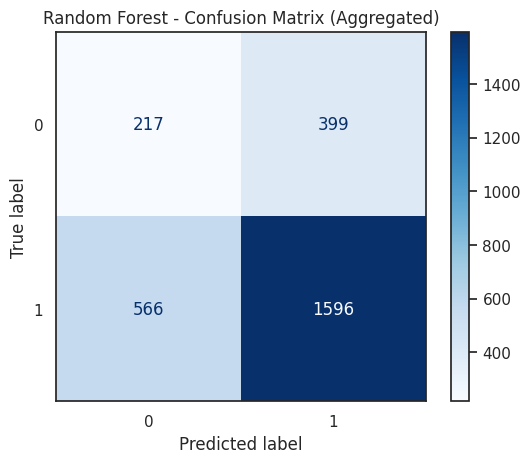

/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [23:24:05] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [23:24:05] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [23:24:05] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [23:24:05] WARNING: /workspace/src/learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)
/usr/local/lib/python3.12/dist-packages/xgboost/training.py:183: UserWarning: [23:24:07] WARNING: /w


XGBoost Classification Report:

              precision    recall  f1-score   support

           0       0.32      0.39      0.35       616
           1       0.81      0.77      0.79      2162

    accuracy                           0.68      2778
   macro avg       0.57      0.58      0.57      2778
weighted avg       0.71      0.68      0.69      2778



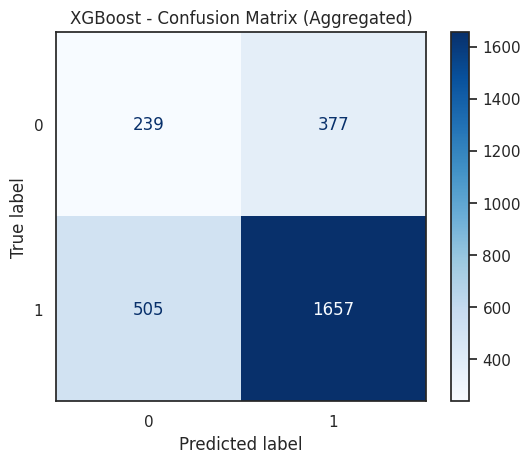


SVM Classification Report:

              precision    recall  f1-score   support

           0       0.28      0.56      0.37       616
           1       0.82      0.58      0.68      2162

    accuracy                           0.57      2778
   macro avg       0.55      0.57      0.52      2778
weighted avg       0.70      0.57      0.61      2778



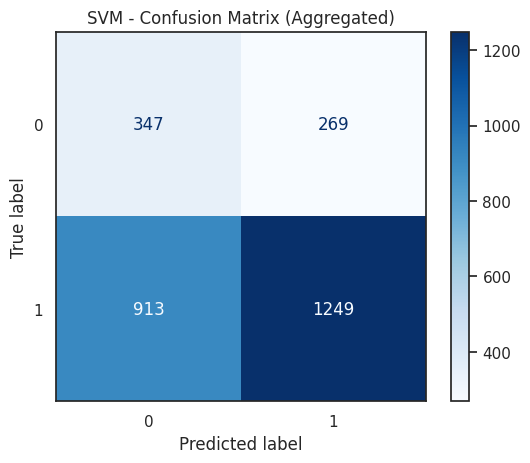


Neural Net Classification Report:

              precision    recall  f1-score   support

           0       0.27      0.52      0.36       616
           1       0.82      0.61      0.70      2162

    accuracy                           0.59      2778
   macro avg       0.55      0.56      0.53      2778
weighted avg       0.70      0.59      0.62      2778



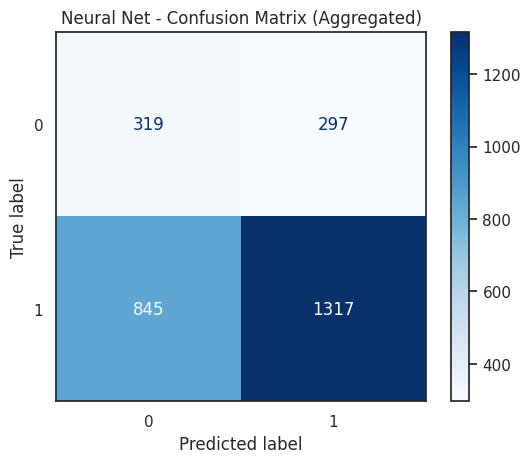


Gradient Boosting Classification Report:

              precision    recall  f1-score   support

           0       0.31      0.37      0.34       616
           1       0.81      0.77      0.79      2162

    accuracy                           0.68      2778
   macro avg       0.56      0.57      0.56      2778
weighted avg       0.70      0.68      0.69      2778



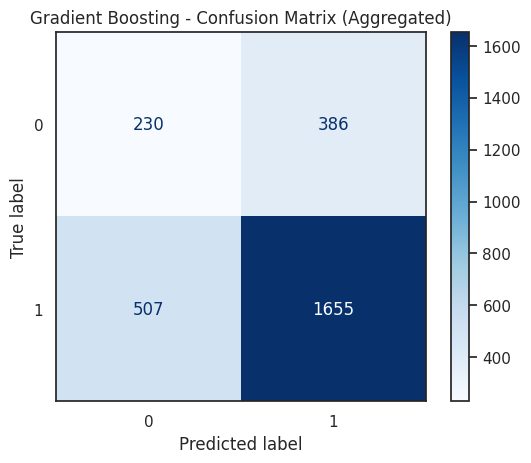


CatBoost Classification Report:

              precision    recall  f1-score   support

           0       0.32      0.38      0.35       616
           1       0.81      0.77      0.79      2162

    accuracy                           0.68      2778
   macro avg       0.57      0.57      0.57      2778
weighted avg       0.70      0.68      0.69      2778



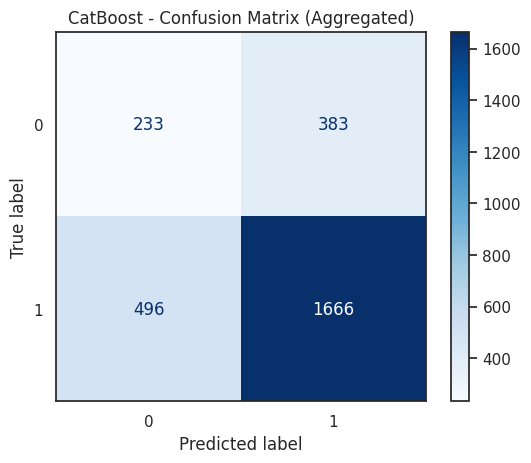


Easy Ensemble Classification Report:

              precision    recall  f1-score   support

           0       0.28      0.64      0.39       616
           1       0.84      0.54      0.65      2162

    accuracy                           0.56      2778
   macro avg       0.56      0.59      0.52      2778
weighted avg       0.72      0.56      0.60      2778



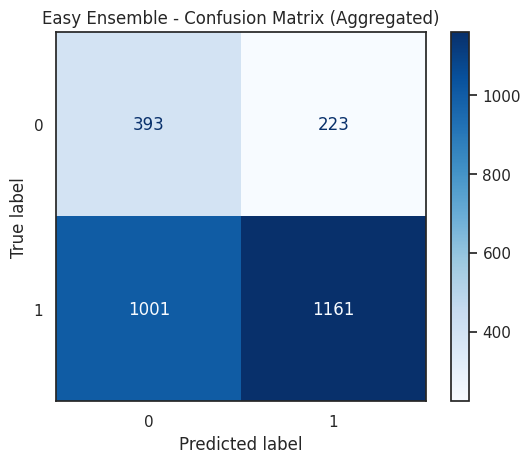


Decision Tree Classification Report:

              precision    recall  f1-score   support

           0       0.27      0.52      0.35       616
           1       0.81      0.59      0.68      2162

    accuracy                           0.57      2778
   macro avg       0.54      0.56      0.52      2778
weighted avg       0.69      0.57      0.61      2778



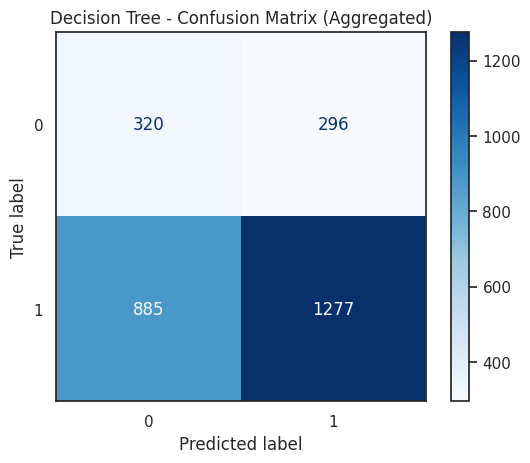

In [77]:
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import ConfusionMatrixDisplay

results = {}

skf = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

for name, model in models.items():
    fold_metrics = {
        "Train Accuracy": [],
        "Test Accuracy": [],
        "Recall": [],
        "Precision": [],
        "F1 Score": [],
        "ROC AUC": []
    }

    # Store aggregate predictions for classification report
    all_y_true, all_y_pred = [], []

    # Loop through folds
    for train_index, test_index in skf.split(X_train, y_train):
        X_tr, X_val = X_train.iloc[train_index], X_train.iloc[test_index]
        y_tr, y_val = y_train.iloc[train_index], y_train.iloc[test_index]

        pipeline = ImbPipeline(steps=[
            ('preprocessor', preprocessor),
            ('smote', SMOTE(random_state=42)),
            ('model', model)
        ])

        pipeline.fit(X_tr, y_tr)
        y_train_pred = pipeline.predict(X_tr)
        y_val_pred = pipeline.predict(X_val)
        y_val_proba = pipeline.predict_proba(X_val)[:, 1] if hasattr(pipeline, "predict_proba") else None

        # Store metrics per fold
        fold_metrics["Train Accuracy"].append(accuracy_score(y_tr, y_train_pred))
        fold_metrics["Test Accuracy"].append(accuracy_score(y_val, y_val_pred))
        fold_metrics["Recall"].append(recall_score(y_val, y_val_pred))
        fold_metrics["Precision"].append(precision_score(y_val, y_val_pred))
        fold_metrics["F1 Score"].append(f1_score(y_val, y_val_pred))
        if y_val_proba is not None:
            fold_metrics["ROC AUC"].append(roc_auc_score(y_val, y_val_proba))

        # Collect predictions for classification report
        all_y_true.extend(y_val)
        all_y_pred.extend(y_val_pred)

    # Average metrics across folds
    results[name] = {metric: np.mean(values) for metric, values in fold_metrics.items()}

    # Classification report (aggregate across all folds)
    print(f"\n{name} Classification Report:\n")
    print(classification_report(all_y_true, all_y_pred))

    #Confusion matrix (aggregate)
    cm = confusion_matrix(all_y_true, all_y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm)
    disp.plot(cmap="Blues", values_format="d")
    plt.title(f"{name} - Confusion Matrix (Aggregated)")
    plt.show()

# Convert to DataFrame (metrics summary)
metrics = pd.DataFrame(results).T


In [78]:
metrics

,Train Accuracy,Test Accuracy,Recall,Precision,F1 Score,ROC AUC
Logistic Regression,0.565606,0.555085,0.535152,0.833975,0.651585,0.613496
Random Forest,0.795627,0.652635,0.738205,0.800012,0.767775,0.565007
XGBoost,0.759629,0.682521,0.766435,0.814713,0.789698,0.609710
SVM,0.617531,0.574522,0.577707,0.823172,0.678794,0.599056
Neural Net,0.678278,0.588904,0.609167,0.815958,0.696577,0.583616
Gradient Boosting,0.723003,0.678556,0.765502,0.810956,0.787533,0.610013
CatBoost,0.739923,0.683587,0.770581,0.813208,0.791268,0.608802
Easy Ensemble,0.567677,0.559397,0.536969,0.840897,0.654127,0.613625
Decision Tree,0.601609,0.574860,0.590719,0.812126,0.674081,0.585806


With cross validation SVM, Ensemble and decision tree still remain top three

In [79]:
# cross val result comparison
#Top model Result comparison
results = {
    "SVM": {
        "train_acc": 0.62,
        "test_acc": 0.57,
        "recall": 0.58,
        "precision": 0.82,
        "f1": 0.68,
        "roc_auc": 0.60
    },
    "Easy Ensemble": {
        "train_acc": 0.57,
        "test_acc": 0.56,
        "recall": 0.54,
        "precision": 0.84,
        "f1": 0.65,
        "roc_auc": 0.61
    },
    "Decision Tree":{
        'train_acc': 0.60,
        'test_acc': 0.57,
        'recall': 0.59,
        'precision': 0.81,
        'f1': 0.67,
        'roc_auc': 0.59
    }
}

df_results2 = pd.DataFrame(results)
print(df_results2)

            SVM  Easy Ensemble  Decision Tree
train_acc  0.62           0.57           0.60
test_acc   0.57           0.56           0.57
recall     0.58           0.54           0.59
precision  0.82           0.84           0.81
f1         0.68           0.65           0.67
roc_auc    0.60           0.61           0.59


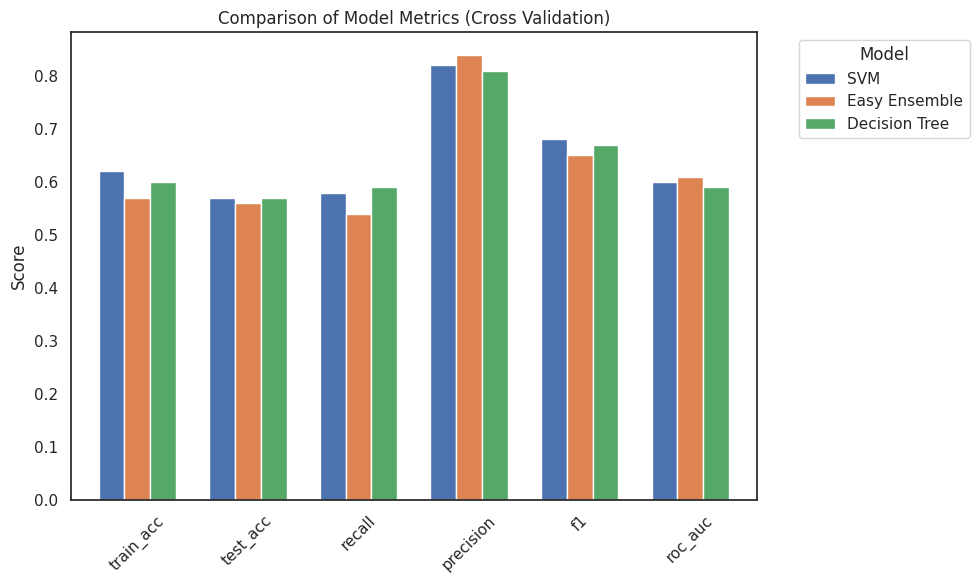

In [80]:
df_results2.plot(kind="bar", figsize=(10,6), width=0.7)
plt.title("Comparison of Model Metrics (Cross Validation)")
plt.ylabel("Score")
plt.xticks(rotation=45)
plt.legend(title="Model", bbox_to_anchor=(1.05,1), loc="upper left")
plt.tight_layout()
plt.show()


From cross-validation, SVM consistently outperformed the other models, showing stronger average performance across the folds

Accuracy: 0.5824847250509165
Precision: 0.8411552346570397
Recall: 0.5913705583756346
F1-score: 0.6944858420268256
ROC-AUC: 0.5996519964414674

Classification Report:
               precision    recall  f1-score   support

           0       0.25      0.55      0.34        97
           1       0.84      0.59      0.69       394

    accuracy                           0.58       491
   macro avg       0.54      0.57      0.52       491
weighted avg       0.72      0.58      0.62       491



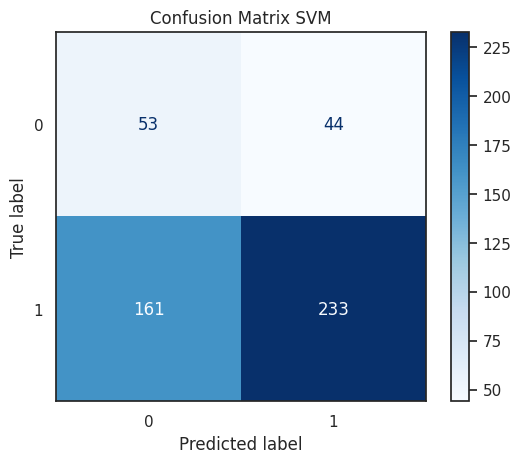

In [81]:
# SVM pipeline (tuned)
pipeline = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', SMOTE(random_state=42)),
    ('model', SVC(
        C=0.08,
        class_weight='balanced',
        kernel='rbf',
        probability=True,
        random_state=42
    ))
])

pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)
y_proba = pipeline.predict_proba(X_test)[:, 1]


# Evaluation
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1-score:", f1_score(y_test, y_pred))
print("ROC-AUC:", roc_auc_score(y_test, y_proba))

print("\nClassification Report:\n", classification_report(y_test, y_pred))

#Confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap="Blues", values_format="d")
plt.title("Confusion Matrix SVM")
plt.show()


After tuning, SVM achieved better result with roc (+0.01)

In [82]:
from sklearn.model_selection import cross_validate, StratifiedKFold

# Define cross-validation strategy
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Cross-validation with multiple metrics
scoring = {
    'accuracy': 'accuracy',
    'precision': 'precision',
    'recall': 'recall',
    'f1': 'f1',
    'roc_auc': 'roc_auc'
}

cv_results = cross_validate(
    pipeline,
    X_train,
    y_train,
    cv=cv,
    scoring=scoring,
    return_train_score=False
)

# Show average performance across folds
print("Tuned SVM Cross-Validation Results (mean across folds):")
for metric in scoring.keys():
    print(f"{metric}: {cv_results['test_' + metric].mean():.4f}")


Tuned SVM Cross-Validation Results (mean across folds):
accuracy: 0.5680
precision: 0.8358
recall: 0.5550
f1: 0.6654
roc_auc: 0.6085


After tuning, cross-validation results for SVM declined — accuracy decreased and recall dropped by 0.02. This indicates that the tuned model underperforms, so we will proceed with the untuned version.

Accuracy: 0.5723014256619144
Precision: 0.851145038167939
Recall: 0.565989847715736
F1-score: 0.6798780487804879
ROC-AUC: 0.6031581977078864

Classification Report:
               precision    recall  f1-score   support

           0       0.25      0.60      0.36        97
           1       0.85      0.57      0.68       394

    accuracy                           0.57       491
   macro avg       0.55      0.58      0.52       491
weighted avg       0.73      0.57      0.62       491



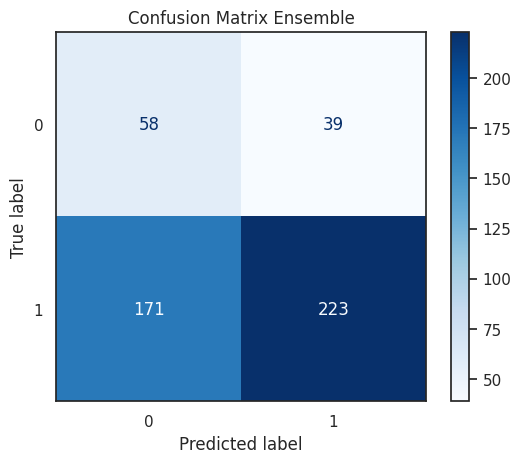

In [83]:
#ensemble
pipeline = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', SMOTE(random_state=42)),
    ('model', EasyEnsembleClassifier(
    n_estimators=100,
    sampling_strategy="auto",
    random_state=42))
])

pipeline.fit(X_train, y_train)

y_pred = pipeline.predict(X_test)
y_proba = pipeline.predict_proba(X_test)[:, 1]


# Evaluation
print("Accuracy:", accuracy_score(y_test, y_pred))
print("Precision:", precision_score(y_test, y_pred))
print("Recall:", recall_score(y_test, y_pred))
print("F1-score:", f1_score(y_test, y_pred))
print("ROC-AUC:", roc_auc_score(y_test, y_proba))

print("\nClassification Report:\n", classification_report(y_test, y_pred))

#Confusion matrix
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix=cm)
disp.plot(cmap="Blues", values_format="d")
plt.title("Confusion Matrix Ensemble")
plt.show()


In [84]:
from sklearn.model_selection import cross_validate, StratifiedKFold

# Define cross-validation strategy
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Cross-validation with multiple metrics
scoring = {
    'accuracy': 'accuracy',
    'precision': 'precision',
    'recall': 'recall',
    'f1': 'f1',
    'roc_auc': 'roc_auc'
}

cv_results = cross_validate(
    pipeline,
    X_train,
    y_train,
    cv=cv,
    scoring=scoring,
    return_train_score=False
)

# Show average performance across folds
print("Ensemble Cross-Validation Results (mean across folds):")
for metric in scoring.keys():
    print(f"{metric}: {cv_results['test_' + metric].mean():.4f}")


Ensemble Cross-Validation Results (mean across folds):
accuracy: 0.5594
precision: 0.8409
recall: 0.5370
f1: 0.6541
roc_auc: 0.6136


After tuning ensemble, results stayed the same as before

Conclusion:

Model performance was generally poor due to feature limitations. Although SVM achieved the best results among the models tested, its performance remains satisfactory. The Stratified k fold validation result shows SVM (untuned) does a better job across folds.

Unless underlying data quality issues are resolved, deploying this model for real-world predictions would not be advisable.

###### Feature Importance


Decision Tree was also evaluated and performed well on the dataset. Its interpretability makes it suitable for extracting feature importance, highlighting the most influential predictors in loan default classification.

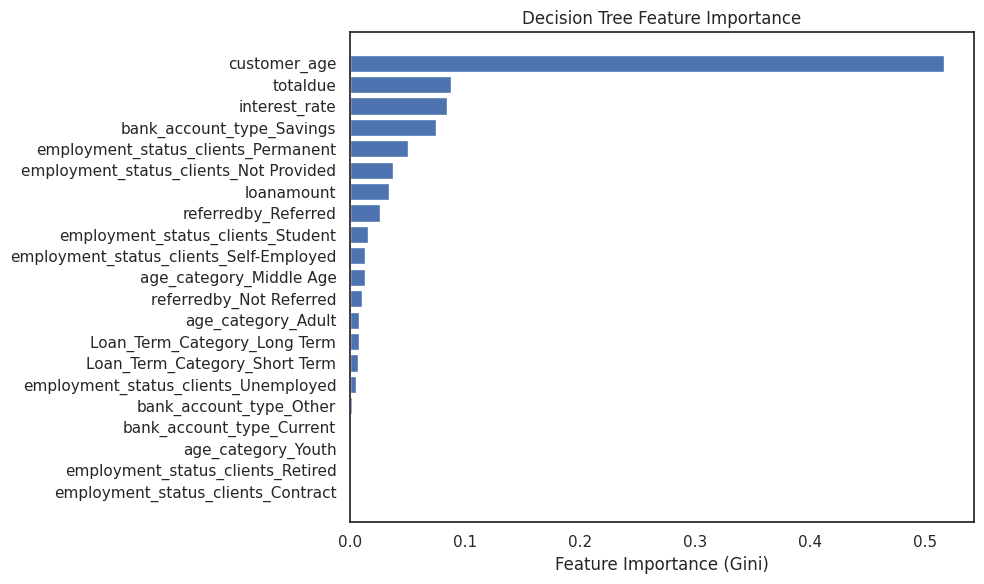

In [85]:
pipeline = ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('smote', SMOTE(random_state=42)),
    ('model', DecisionTreeClassifier(class_weight='balanced', random_state=42))
])

# Fit
pipeline.fit(X_train, y_train)

# Get feature names (same logic as your code)
if isinstance(pipeline.named_steps['preprocessor'], ColumnTransformer):
    feature_names = []
    for name, transformer, columns in pipeline.named_steps['preprocessor'].transformers_:
        if hasattr(transformer, 'get_feature_names_out'):
            feature_names.extend(transformer.get_feature_names_out(columns))
        else:
            feature_names.extend(columns)
else:
    feature_names = X_train.columns.tolist()

# Extract feature importance
dt_importance = pipeline.named_steps['model'].feature_importances_
dt_importance_df = pd.DataFrame({
    'feature': feature_names,
    'importance': dt_importance
}).sort_values(by='importance', ascending=False)

# Plot
plt.figure(figsize=(10, 6))
plt.barh(dt_importance_df['feature'], dt_importance_df['importance'])
plt.xlabel('Feature Importance (Gini)')
plt.title('Decision Tree Feature Importance')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()


##### Saving Pipeline for deployment

In [86]:
Perf_model2= ImbPipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', SVC(
        class_weight='balanced',
        probability=True,
        random_state=42))
])

In [87]:
#fit_model on dataset
Perf_model2.fit(X,y)

Pipeline(steps=[('preprocessor',
                 ColumnTransformer(transformers=[('num',
                                                  Pipeline(steps=[('scaler',
                                                                   StandardScaler())]),
                                                  ['loanamount', 'totaldue',
                                                   'interest_rate',
                                                   'customer_age']),
                                                 ('cat',
                                                  Pipeline(steps=[('encoder',
                                                                   OneHotEncoder(handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['referredby',
                                                   'bank_account_type',
                                                   'employment_status_clients',
                                                   'age_category',
                                                   'Loan_Term_Category'])])),
                ('model',
                 SVC(class_weight='balanced', probability=True,
                     random_state=42))])

In [88]:
#save model
import joblib
joblib.dump(Perf_model2, 'Loan_defaulter_predictor.pkl')

['Loan_defaulter_predictor.pkl']

In [89]:
from google.colab import files
files.download('Loan_defaulter_predictor.pkl')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

## Final Note:

It is highly imperative that future studies make use of datasets enriched with detailed customer information to enable more accurate predictions of loan default. Additionally, employing larger datasets will further enhance model robustness and reliability.